# Setup

In [2]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.options.mode.chained_assignment = None  # default='warn'
import plotly.express as px
from scipy.signal import find_peaks
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

In [2]:
with open('patientdata/sensing.json') as json_file:
    sensing = json.load(json_file)
subject_ids = list(sensing.keys())   
subject_ids = ["1", "2"]

In [8]:
import pickle
with open('/home/hubble/work/serenade/src/subject_data_sepetember2023_may2024_2hours.pkl', 'rb') as file:
    data = pickle.load(file)

import pandas as pd
import plotly.express as px

data_subject_2 = data['subject_2']
environmental_sensors = list(data_subject_2.keys())
concatenated_df = pd.DataFrame()


def plot_sensor_active_periods(data_subject_2, environmental_sensors, st, et):

    concatenated_df = pd.DataFrame()

    for sens in range(11):
        df_sensor = data_subject_2[environmental_sensors[sens]][1]
        filtered_df = df_sensor[
            (df_sensor['ts_on'].dt.time >= st) &
            (df_sensor['ts_on'].dt.time < et)
        ]
        sub_df_sensor = filtered_df[['sensor_id', 'ts_on', 'ts_off']]
        concatenated_df = pd.concat([concatenated_df, sub_df_sensor], ignore_index=True)
    
    # Create a timeline plot
    fig = px.timeline(concatenated_df, x_start='ts_on', x_end='ts_off', y='sensor_id', color='sensor_id',
                      labels={'sensor_id': 'Sensor ID'})
    
    # Customize the layout
    fig.update_layout(
        title="Sensor Active Periods Over Time",
        xaxis_title="Time",
        yaxis_title="Sensor ID",
    )
    
    # Show the plot
    fig.show()

st = pd.to_datetime('2023-09-10 07:00:00.000').time()
et = pd.to_datetime('2023-09-10 08:00:00.000').time()

plot_sensor_active_periods(data_subject_2, environmental_sensors, st, et)

In [3]:
raw_data_path = "DATA/"
preprocessed_data_path = "PREPROCESSED_DATA/"
if not os.path.exists(preprocessed_data_path):
    os.makedirs(preprocessed_data_path)

In [4]:
# identify when ther is a peak in one dimension and not in the other
# Also is interesting to show where this pattern is broken (eg days in which peak time is different or we don't see a peak)
# Attributo width dei peak find possiamo trovare picchi con almeno X di ampiezza, utili forse per non considerare eposodi troppo brevi? o magari se c'è fosse anche un massimo di ampiezza potremmo isolare picchi dovuti alla normale variazione della temperatura

# Utils

In [5]:
def plot_temperature_and_humidity_peaks(temperature_df, humidity_df, temperature_peaks, humidity_peaks, sensor_name=""):
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True,) 
    fig.add_trace(go.Scatter(x=temperature_df.reset_index().ts, y=temperature_df.sensor_status, mode='lines', name='Temperature', line=dict(color='red')), row=1, col=1)
    fig.add_trace(go.Scatter(x=humidity_df.reset_index().ts, y=humidity_df.sensor_status, mode='lines', name='Humidity', line=dict(color='blue')), row=2, col=1)
    for an in temperature_peaks:
        fig.add_vline(x=an, line_width=2, line_dash="dot", line_color="red", row=1, col=1, visible=True)
    for an in humidity_peaks:
        fig.add_vline(x=an, line_width=2, line_dash="dot", line_color="blue", row=2, col=1, visible=True)
    fig.update_yaxes(range=[temperature_df.sensor_status.min(), temperature_df.sensor_status.max()], row=1)
    fig.update_yaxes(range=[humidity_df.sensor_status.min(), humidity_df.sensor_status.max()], row=2)
    fig.update_layout(yaxis=dict(fixedrange=True))
    fig.update_layout(title=f"{sensor_name} Temperature and Humidity")
    fig.show()

# Subject 1

### Shower

In [6]:
temp_data_path = f"{raw_data_path}subject_1/environmentals/Shower_Hum_Temp_temp.csv"
shower_temp_df = pd.read_csv(temp_data_path).sort_values("ts")
shower_temp_df.ts = pd.to_datetime(shower_temp_df.ts, unit="ms") + pd.DateOffset(hours=2)
shower_temp_df = shower_temp_df[(shower_temp_df.sensor_status!="unavailable") & (shower_temp_df.sensor_status!="unknown")]
shower_temp_df.sensor_status = shower_temp_df.sensor_status.astype(float)

humidity_data_path = f"{raw_data_path}subject_1/environmentals/Shower_Hum_Temp_humidity.csv"
shower_hum_df = pd.read_csv(humidity_data_path).sort_values("ts")
shower_hum_df.ts = pd.to_datetime(shower_hum_df.ts, unit="ms") + pd.DateOffset(hours=2)
shower_hum_df = shower_hum_df[(shower_hum_df.sensor_status!="unavailable") & (shower_hum_df.sensor_status!="unknown")]
shower_hum_df.sensor_status = shower_hum_df.sensor_status.astype(float)

In [7]:
temp_signal = shower_temp_df[(shower_temp_df['ts'] > "2023-01-01") & (shower_temp_df['ts'] < "2024-12-10")]
temp_signal = temp_signal.set_index('ts')
hum_signal = shower_hum_df[(shower_hum_df['ts'] > "2023-01-01") & (shower_hum_df['ts'] < "2024-12-10")]
hum_signal = hum_signal.set_index('ts')

In [8]:
temp_peaks, _ = find_peaks(temp_signal.sensor_status, prominence=0.3)
temp_peaks = [temp_signal.iloc[p].name for p in temp_peaks]
hum_peaks, _ = find_peaks(hum_signal.sensor_status, prominence=10)
hum_peaks = [hum_signal.iloc[p].name for p in hum_peaks]

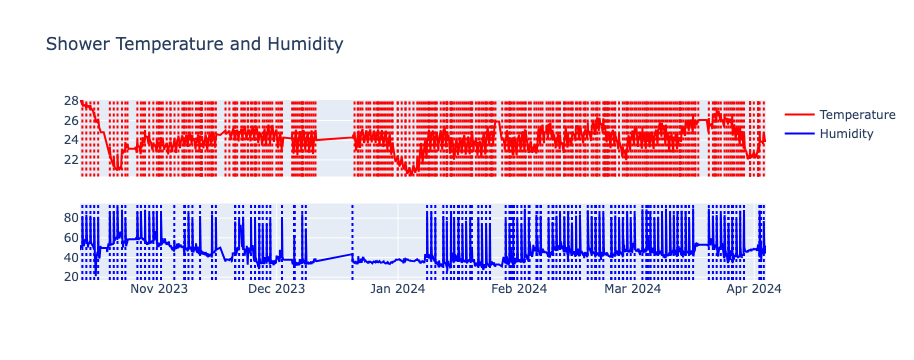

In [9]:
plot_temperature_and_humidity_peaks(temp_signal, hum_signal, temp_peaks, hum_peaks, "Shower")

# Subject 2

## Stove

In [6]:
temp_data_path = f"{raw_data_path}subject_2/environmentals/Hum_Temp_Stove_temp.csv"
shower_temp_df = pd.read_csv(temp_data_path).sort_values("ts")
shower_temp_df.ts = pd.to_datetime(shower_temp_df.ts, unit="ms") + pd.DateOffset(hours=2)
shower_temp_df = shower_temp_df[(shower_temp_df.sensor_status!="unavailable") & (shower_temp_df.sensor_status!="unknown")]
shower_temp_df.sensor_status = shower_temp_df.sensor_status.astype(float)

humidity_data_path = f"{raw_data_path}subject_2/environmentals/Hum_Temp_Stove_humidity.csv"
shower_hum_df = pd.read_csv(humidity_data_path).sort_values("ts")
shower_hum_df.ts = pd.to_datetime(shower_hum_df.ts, unit="ms") + pd.DateOffset(hours=2)
shower_hum_df = shower_hum_df[(shower_hum_df.sensor_status!="unavailable") & (shower_hum_df.sensor_status!="unknown")]
shower_hum_df.sensor_status = shower_hum_df.sensor_status.astype(float)

In [7]:
temp_signal = shower_temp_df[(shower_temp_df['ts'] > "2023-01-17") & (shower_temp_df['ts'] < "2024-12-23")]
temp_signal = temp_signal.set_index('ts')
hum_signal = shower_hum_df[(shower_hum_df['ts'] > "2023-01-17") & (shower_hum_df['ts'] < "2024-12-23")]
hum_signal = hum_signal.set_index('ts')

In [8]:
temp_peaks, _ = find_peaks(temp_signal.sensor_status, prominence=1.5)
temp_peaks = [temp_signal.iloc[p].name for p in temp_peaks]
hum_peaks, _ = find_peaks(hum_signal.sensor_status, prominence=10)
hum_peaks = [hum_signal.iloc[p].name for p in hum_peaks]

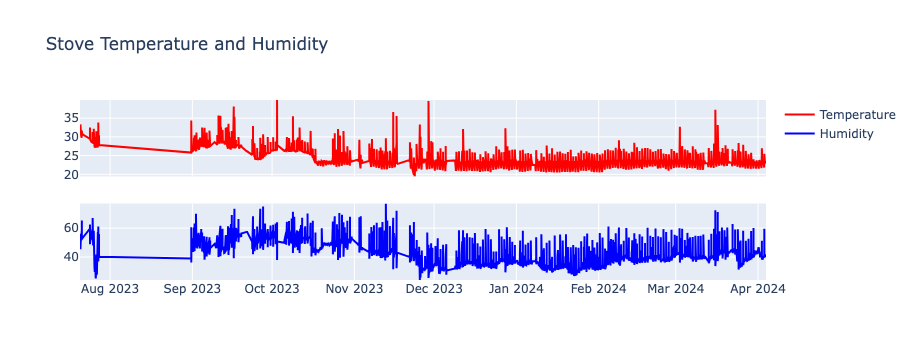

In [9]:
plot_temperature_and_humidity_peaks(temp_signal, hum_signal, [], [], sensor_name="Stove")

In [10]:
#plot_temperature_and_humidity_peaks(temp_signal, hum_signal, temp_peaks, hum_peaks, sensor_name="Stove")

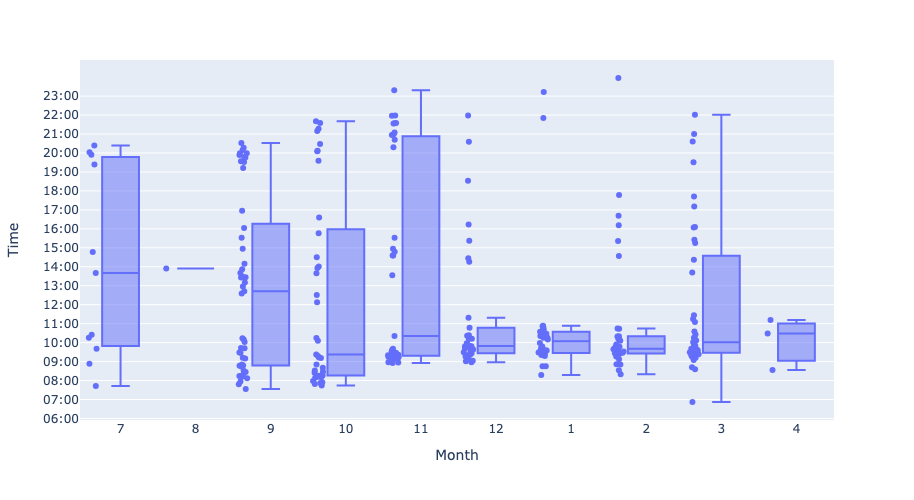

In [43]:
# Distribuzione degli orari dei picchi di temperatura in cucina

group_column = "month"
df = pd.DataFrame(temp_peaks, columns=["datetime"])
df["year"] = df.datetime.dt.year
df["month"] = df.datetime.dt.month
df["dayofmonth"] = df.datetime.dt.day
df["dayofweek"] = df.datetime.dt.dayofweek
df["week"] = df.datetime.dt.isocalendar().week
df["hour"] = df.datetime.dt.hour
df["secondsfrommidnight"] = (df.datetime - df.datetime.dt.normalize()).astype(int) // 1000000000
df = df[df.hour>=0]
df["group"] = df[group_column].apply(lambda x: list(df[group_column].unique()).index(x))
df["grouplabel"] = df.group.apply(lambda x: str(df[group_column].unique()[x]))
fig = px.box(df, x="grouplabel", y="secondsfrommidnight", notched=False, points="all")
fig.update_yaxes(title_text='Time', tickvals=list(range(0, 86400, 3600)), ticktext=[pd.to_datetime(i, unit='s').strftime('%H:%M') for i in range(0, 86400, 3600)])
fig.update_xaxes(title_text=group_column.capitalize())
fig.update_layout(
    height=500
)
fig.show()

In [12]:
df

,datetime,year,month,dayofmonth,dayofweek,week,hour,secondsfrommidnight,group,grouplabel
0,2023-07-20 20:02:45.557,2023,7,20,3,29,20,72165,0,7
1,2023-07-21 08:52:51.120,2023,7,21,4,29,8,31971,0,7
2,2023-07-24 10:15:19.485,2023,7,24,0,30,10,36919,0,7
3,2023-07-25 10:25:14.775,2023,7,25,1,30,10,37514,0,7
4,2023-07-25 14:46:23.584,2023,7,25,1,30,14,53183,0,7
...,...,...,...,...,...,...,...,...,...,...
271,2024-03-30 06:52:06.240,2024,3,30,5,13,6,24726,8,3
272,2024-03-31 11:04:54.689,2024,3,31,6,13,11,39894,8,3
273,2024-04-01 11:11:18.524,2024,4,1,0,14,11,40278,9,4
274,2024-04-02 10:28:36.254,2024,4,2,1,14,10,37716,9,4


In [13]:
# Distribuzione del numero di picchi di temperatura in cucina
group_column = "month"
df = pd.DataFrame(temp_peaks, columns=["datetime"])
df["year"] = df.datetime.dt.year
df["month"] = df.datetime.dt.month
df["dayofmonth"] = df.datetime.dt.day
df["dayofweek"] = df.datetime.dt.dayofweek
df["week"] = df.datetime.dt.isocalendar().week
df["hour"] = df.datetime.dt.hour
df["secondsfrommidnight"] = (df.datetime - df.datetime.dt.normalize()).astype(int) // 1000000000

df["group"] = df[group_column].apply(lambda x: list(df[group_column].unique()).index(x))


In [14]:
count_df = df.groupby(["year", "month", "week","dayofweek"]).size().reset_index(name="count")
count_df.month = count_df.month.apply(lambda x: str(x))

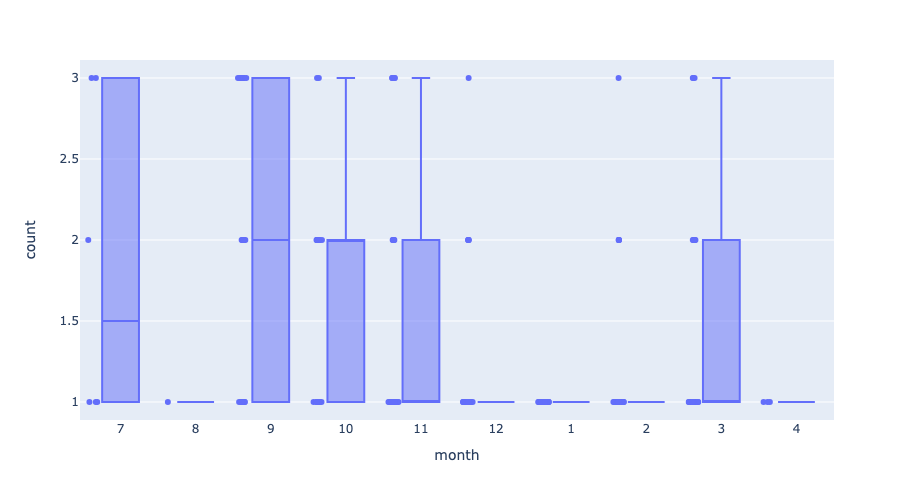

In [15]:
fig = px.box(count_df, x="month", y="count", notched=False, points="all")
fig.update_layout(
    height=500
)
fig.show()

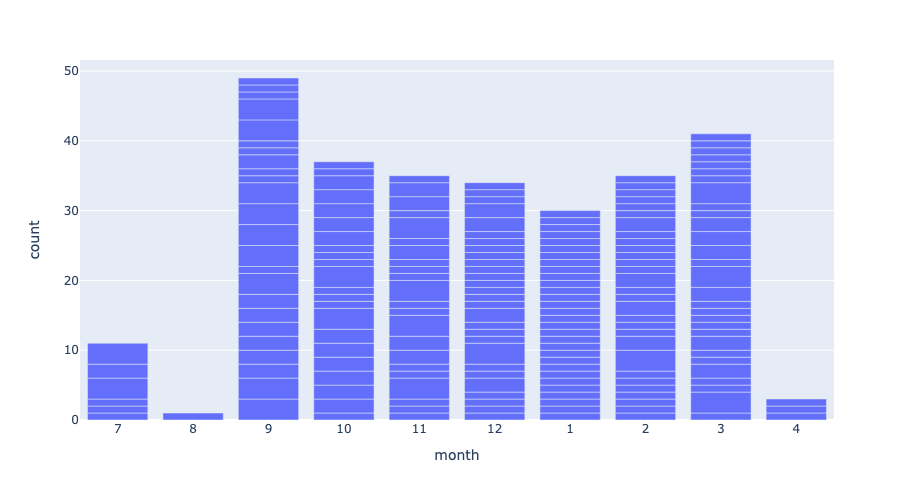

In [16]:
fig = px.bar(count_df, x="month", y="count")
fig.update_layout(
    height=500
)
fig.show()

# Plots

In [17]:
def create_plot(environmentals_df, locations_df, temperature_df, humidity_df, start_date=None, end_date=None):
    
    if start_date is not None:
        environmentals_df = environmentals_df[environmentals_df.ts_on>=start_date]
        locations_df = locations_df[locations_df.ts_on>=start_date]
        temperature_df = temperature_df[temperature_df.index>=start_date]
        humidity_df = humidity_df[humidity_df.index>=start_date]
        
    if end_date is not None:
        environmentals_df = environmentals_df[environmentals_df.ts_off<=end_date]
        locations_df = locations_df[locations_df.ts_off<=end_date]
        temperature_df = temperature_df[temperature_df.index<=end_date]
        humidity_df = humidity_df[humidity_df.index<=end_date]
    
    
    fig = make_subplots(
        rows=4, 
        cols=1, 
        shared_xaxes=True, 
        row_heights=[0.4, 0.4, 0.1, 0.1],
        vertical_spacing = 0.01
    ) 
    
    
    fig.add_trace(
        go.Scatter(
            x=temperature_df.reset_index().ts, 
            y=temperature_df.sensor_status, 
            mode='lines', 
            name='Temperature', 
            line=dict(color='red')
        ), 
        row=3, 
        col=1
    )
    
    fig.add_trace(
        go.Scatter(
            x=humidity_df.reset_index().ts, 
            y=humidity_df.sensor_status, 
            mode='lines', 
            name='Humidity', 
            line=dict(color='blue')
        ), 
        row=4, 
        col=1
    )
    
    fig1 = go.Figure(
            px.timeline(
                locations_df, 
                x_start='ts_on', 
                x_end='ts_off', 
                y='sensor_id', 
                color='sensor_id',
                #hover_data={'ts_on': '|%Y-%m-%d %H:%M:%S', 'ts_off': '|%Y-%m-%d %H:%M:%S'},
            )
    )
    fig2 = go.Figure(
            px.timeline(
                environmentals_df, 
                x_start='ts_on', 
                x_end='ts_off', 
                y='sensor_id', 
                color='sensor_id',
                #hover_data={'ts_on': '|%Y-%m-%d %H:%M:%S', 'ts_off': '|%Y-%m-%d %H:%M:%S'},
            )
    )
    #fig1.update_layout(yaxis=dict(fixedrange=True))

    
    for i in range(len(fig1.data)):
        fig.append_trace(fig1.data[i],row=2,col=1)
        
    for i in range(len(fig2.data)):
        fig.append_trace(fig2.data[i],row=1,col=1)

    
        
    fig.update_layout(barmode='overlay')
    fig.update_yaxes(fixedrange=True)
    #fig.update_layout(yaxis=dict(fixedrange=True, autorange=True))
    '''fig.update_yaxes(range=[temperature_df.sensor_status.min(), temperature_df.sensor_status.max()], row=3)
    fig.update_yaxes(range=[humidity_df.sensor_status.min(), humidity_df.sensor_status.max()], row=4)
    '''
    fig.update_layout(height=500) 
    fig.update_xaxes(type='date')
    fig.show()
    return

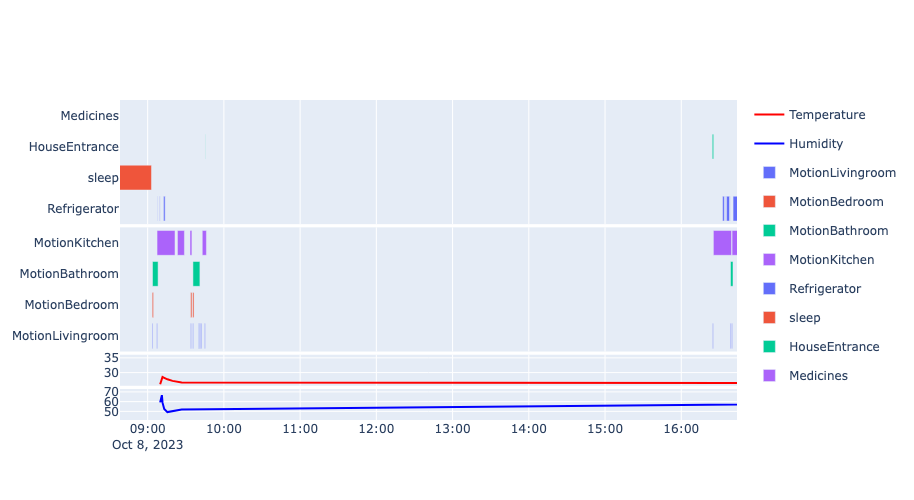

In [212]:
create_plot(
    environmentals_df, 
    locations_df, 
    temp_signal, 
    hum_signal, 
    start_date="2023-10-08", 
    end_date="2023-10-09"
)

In [211]:
temp_peaks

[Timestamp('2023-07-20 20:02:45.557000'),
 Timestamp('2023-07-21 08:52:51.120000'),
 Timestamp('2023-07-24 10:15:19.485000'),
 Timestamp('2023-07-25 10:25:14.775000'),
 Timestamp('2023-07-25 14:46:23.584000'),
 Timestamp('2023-07-25 20:23:36.976000'),
 Timestamp('2023-07-26 07:43:05.057000'),
 Timestamp('2023-07-26 19:23:56.857000'),
 Timestamp('2023-07-27 09:40:18.754000'),
 Timestamp('2023-07-27 13:40:27.411000'),
 Timestamp('2023-07-27 19:54:49.694000'),
 Timestamp('2023-08-31 13:54:40.470000'),
 Timestamp('2023-09-01 08:43:16.314000'),
 Timestamp('2023-09-01 13:26:02.236000'),
 Timestamp('2023-09-01 19:31:44.028000'),
 Timestamp('2023-09-02 08:14:39.833000'),
 Timestamp('2023-09-02 12:42:52.791000'),
 Timestamp('2023-09-02 20:31:23.448000'),
 Timestamp('2023-09-03 08:07:25.761000'),
 Timestamp('2023-09-03 19:59:11.739000'),
 Timestamp('2023-09-04 07:48:24.658000'),
 Timestamp('2023-09-04 16:02:18.533000'),
 Timestamp('2023-09-05 09:42:56.091000'),
 Timestamp('2023-09-05 13:40:02.04

In [18]:
motion_sensors_paths = {
    2: {
        "MotionBathroom" : "DATA/subject_2/environmentals/MotionBathroom.csv",
        "MotionBedroom" : "DATA/subject_2/environmentals/MotionBedroom.csv",
        "MotionKitchen" : "DATA/subject_2/environmentals/MotionKitchen.csv",
        "MotionLivingroom" : "DATA/subject_2/environmentals/MotionLivingroom.csv",
        "MotionOtherroom" : "DATA/subject_2/environmentals/MotionOtherroom.csv"
    }
}

In [19]:
motion_sensors_data = {}
for subject in motion_sensors_paths.keys():
    motion_sensors_data[subject] = []
    print(f"--- CHECKING MOTION SENSOR DATA FOR SUBJECT {subject} ---")
    for path in motion_sensors_paths[subject]:
        print(motion_sensors_paths[subject][path])
        df = pd.read_csv(motion_sensors_paths[subject][path]) 
        wrong_data = df[(df.sensor_status!="on") & (df.sensor_status!="off")]
        wrong_data.ts = pd.to_datetime(wrong_data.ts, unit="ms").dt.date.astype(str)
        wrong_data_indexes = list(df[(df.sensor_status!="on") & (df.sensor_status!="off")].index)
        wrong_data_intervals = []
        for i in list(df[(df.sensor_status!="on") & (df.sensor_status!="off")].index):
            if i == 0:
                wrong_data_intervals.append(((list(df.iloc[i:i+2].ts)[1])-(list(df.iloc[i:i+2].ts)[0]) ) / 1000)
                continue
            wrong_data_intervals.append(((list(df.iloc[i-1:i+2].ts)[2])-(list(df.iloc[i-1:i+2].ts)[1]) ) / 1000)
        df.drop(wrong_data_indexes, inplace=True)
        for i in reversed(list(df.index)[1:]):
            if df.loc[i].sensor_status == df.iloc[df.index.get_loc(i)-1].sensor_status:
                df.drop([i], inplace=True)
        motion_sensors_data[subject].append(df)
    print()

--- CHECKING MOTION SENSOR DATA FOR SUBJECT 2 ---
DATA/subject_2/environmentals/MotionBathroom.csv
DATA/subject_2/environmentals/MotionBedroom.csv
DATA/subject_2/environmentals/MotionKitchen.csv
DATA/subject_2/environmentals/MotionLivingroom.csv
DATA/subject_2/environmentals/MotionOtherroom.csv



In [20]:
motion_sensors_dfs = {}
pd.set_option('display.float_format', lambda x: '%.2f' % x)
for subject in motion_sensors_data.keys():
    motion_sensors_dfs[subject] = []
    for df in motion_sensors_data[subject]:
        print(f"{list(df.sensor_id)[0]} of patient {subject}")
        if df.iloc[0].sensor_status == "off":
            df = df.iloc[1:]
        mask_on = (df['sensor_status'] == 'on')
        df_on = df[mask_on]
        mask_off = (df['sensor_status'] == 'off')
        df_off = df[mask_off]
        df_on.rename(columns={'ts': 'ts_on'}, inplace=True)
        df_off.rename(columns={'ts': 'ts_off'}, inplace=True)
        df_on.reset_index(inplace=True)
        df_off.reset_index(inplace=True)
        df_conc = pd.concat([df_on, df_off['ts_off']], axis=1)
        df_conc.drop('index', axis=1, inplace=True)
        df_conc['duration_ms'] = df_conc.ts_off - df_conc.ts_on
        df_conc.ts_on = pd.to_datetime(df_conc.ts_on, unit='ms')
        df_conc.ts_off = pd.to_datetime(df_conc.ts_off, unit='ms')
        df_conc = df_conc[['sensor_id', 'subject_id', 'sensor_status', 'ts_on', 'ts_off', 'duration_ms']]
        motion_sensors_dfs[subject].append(df_conc.sort_values("ts_on"))

MotionBathroom of patient 2
MotionBedroom of patient 2
MotionKitchen of patient 2
MotionLivingroom of patient 2
MotionOtherroom of patient 2


In [21]:
locations_df = pd.concat(motion_sensors_dfs[2]).sort_values("ts_on").reset_index(drop=True)
locations_df.ts_on = locations_df.ts_on + pd.DateOffset(hours=2)
locations_df.ts_off = locations_df.ts_off + pd.DateOffset(hours=2)

In [22]:
env_sensors_paths = { #SENZA I MOTION
    2: {
        "Dishes_Silverware": "DATA/subject_2/environmentals/Dishes_Silverware.csv",
        "FoodStorage": "DATA/subject_2/environmentals/FoodStorage.csv",
        "HouseEntrance": "DATA/subject_2/environmentals/HouseEntrance.csv",
        "Medicines": "DATA/subject_2/environmentals/Medicines.csv",
        "PlugTvHall_events": "DATA/subject_2/environmentals/PlugTvHall_events.csv",
        "Refrigerator": "DATA/subject_2/environmentals/Refrigerator.csv",
        "sleep" : "DATA/subject_2/sleep/sleep_events.csv"
    }
}

In [23]:
env_sensors_data = {}
for subject in env_sensors_paths.keys():
    env_sensors_data[subject] = []
    print(f"--- CHECKING ENV SENSORS (NO MOTION) DATA FOR SUBJECT {subject} ---")
    for path in env_sensors_paths[subject]:
        print(env_sensors_paths[subject][path])
        df = pd.read_csv(env_sensors_paths[subject][path]) 
        wrong_data = df[(df.sensor_status!="on") & (df.sensor_status!="off")]
        wrong_data_indexes = list(df[(df.sensor_status!="on") & (df.sensor_status!="off")].index)
        df.drop(wrong_data_indexes, inplace=True)
        for i in reversed(list(df.index)[1:]):
            if df.loc[i].sensor_status == df.iloc[df.index.get_loc(i)-1].sensor_status:
                df.drop([i], inplace=True)
        env_sensors_data[subject].append(df)
    print()

--- CHECKING ENV SENSORS (NO MOTION) DATA FOR SUBJECT 2 ---
DATA/subject_2/environmentals/Dishes_Silverware.csv
DATA/subject_2/environmentals/FoodStorage.csv
DATA/subject_2/environmentals/HouseEntrance.csv
DATA/subject_2/environmentals/Medicines.csv
DATA/subject_2/environmentals/PlugTvHall_events.csv
DATA/subject_2/environmentals/Refrigerator.csv
DATA/subject_2/sleep/sleep_events.csv



In [24]:
env_sensors_dfs = {}
pd.set_option('display.float_format', lambda x: '%.2f' % x)
for subject in env_sensors_data.keys():
    env_sensors_dfs[subject] = []
    for df in env_sensors_data[subject]:
        print(f"{list(df.sensor_id)[0]} of patient {subject}")
        if df.iloc[0].sensor_status == "off":
            df = df.iloc[1:]
        mask_on = (df['sensor_status'] == 'on')
        df_on = df[mask_on]
        mask_off = (df['sensor_status'] == 'off')
        df_off = df[mask_off]
        df_on.rename(columns={'ts': 'ts_on'}, inplace=True)
        df_off.rename(columns={'ts': 'ts_off'}, inplace=True)
        df_on.reset_index(inplace=True)
        df_off.reset_index(inplace=True)
        df_conc = pd.concat([df_on, df_off['ts_off']], axis=1)
        df_conc.drop('index', axis=1, inplace=True)
        df_conc['duration_ms'] = df_conc.ts_off - df_conc.ts_on
        df_conc.ts_on = pd.to_datetime(df_conc.ts_on, unit='ms')
        df_conc.ts_off = pd.to_datetime(df_conc.ts_off, unit='ms')
        df_conc = df_conc[['sensor_id', 'subject_id', 'sensor_status', 'ts_on', 'ts_off', 'duration_ms']]
        env_sensors_dfs[subject].append(df_conc.sort_values("ts_on"))

Dishes_Silverware of patient 2
FoodStorage of patient 2
HouseEntrance of patient 2
Medicines of patient 2
PlugTvHall of patient 2
Refrigerator of patient 2
sleep of patient 2


In [25]:
environmentals_df = pd.concat(env_sensors_dfs[2]).sort_values("ts_on").reset_index(drop=True)
environmentals_df.ts_on = environmentals_df.ts_on + pd.DateOffset(hours=2)
environmentals_df.ts_off = environmentals_df.ts_off + pd.DateOffset(hours=2)

In [26]:
environmentals_df

,sensor_id,subject_id,sensor_status,ts_on,ts_off,duration_ms
0,Refrigerator,2,on,2023-07-20 14:36:43.161,2023-07-20 14:37:22.260,39099
1,HouseEntrance,2,on,2023-07-20 14:52:31.641,2023-07-20 14:52:46.369,14728
2,HouseEntrance,2,on,2023-07-20 19:27:07.392,2023-07-20 19:27:41.157,33765
3,HouseEntrance,2,on,2023-07-20 19:45:29.226,2023-07-20 19:45:44.883,15657
4,Refrigerator,2,on,2023-07-20 19:48:48.744,2023-07-20 19:49:13.990,25246
...,...,...,...,...,...,...
7272,Refrigerator,2,on,2024-04-03 22:58:03.703,2024-04-03 22:58:25.568,21865
7273,Refrigerator,2,on,2024-04-03 23:03:56.333,2024-04-03 23:04:20.308,23975
7274,Refrigerator,2,on,2024-04-03 23:05:11.089,2024-04-03 23:05:17.138,6049
7275,Refrigerator,2,on,2024-04-04 00:09:12.769,2024-04-04 00:09:54.429,41660


In [27]:
df_concat = pd.concat([environmentals_df, locations_df]).sort_values("ts_on").reset_index()

In [28]:
indices = df_concat.index[df_concat.sensor_id == 'HouseEntrance']

In [29]:
subject_id = 2

out_events = []

# Iterate over the indices to extract sub-dataframes
for i in range(len(indices)):
    start_index = indices[i]
    end_index = indices[i+1] if i < len(indices) - 1 else len(df_concat)
    sub_df = df_concat.iloc[start_index:end_index+1]
    if len(sub_df) == 2 and sub_df.sensor_id.iloc[0] == sub_df.sensor_id.iloc[1] == "HouseEntrance":
        out_events.append({
            "sensor_id": "OutVirtual",
            "subject_id": subject_id,
            "ts_on": sub_df.ts_off.iloc[0],
            "ts_off": sub_df.ts_on.iloc[1]
        })

In [77]:
out_df = pd.DataFrame(out_events)

In [78]:
group_column = "month"
out_df["Time"] = pd.to_datetime(out_df.ts_on)
out_df["year"] = out_df.Time.dt.year
out_df["month"] = out_df.Time.dt.month
out_df["dayofmonth"] = out_df.Time.dt.day
out_df["dayofweek"] = out_df.Time.dt.dayofweek
out_df["week"] = out_df.Time.dt.isocalendar().week
out_df["hour"] = out_df.Time.dt.hour
out_df["off_hour"] = pd.to_datetime(out_df.ts_off).dt.hour
out_df["duration"] = out_df.ts_on - out_df.ts_off
out_df.duration = abs(out_df.duration.apply(lambda x: x / np.timedelta64(1, 'h')))
out_df.month = out_df.month.apply(lambda x: str(x))
out_df.week = out_df.week.apply(lambda x: str(x))

In [79]:
out_df = out_df[out_df.ts_on>="2023-09-01"]
out_df = out_df[out_df.ts_on<"2024-04-01"]
out_df = out_df[out_df.duration<15]

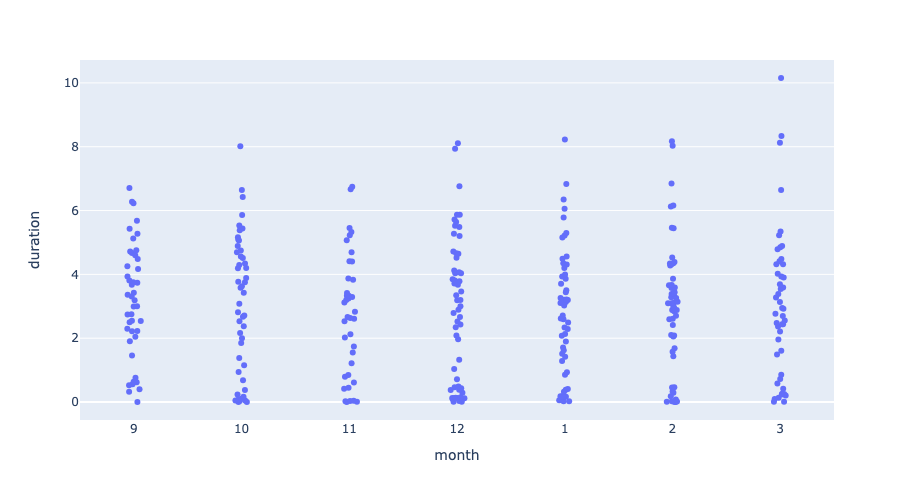

In [80]:
fig = px.strip(out_df, x="month", y="duration")
fig.update_layout(
    height=500
)
fig.show()

In [81]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

In [82]:
count_df = out_df.groupby(["year", "month", "week","dayofweek"]).size().reset_index(name="count")
count_df.month = count_df.month.apply(lambda x: months[int(x)-1])

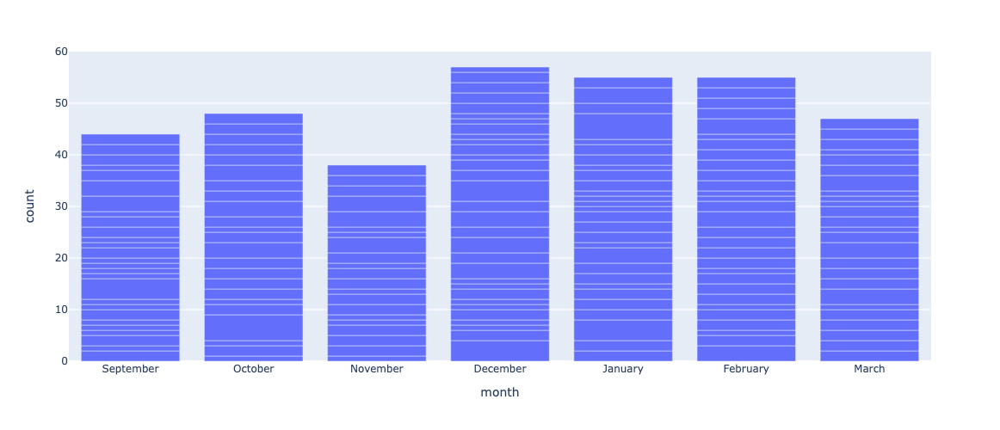

In [83]:
fig = px.bar(count_df, x="month", y="count", 
             category_orders={'month':['September', 'October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', ]},)
fig.update_layout(
    height=500
)
fig.show()

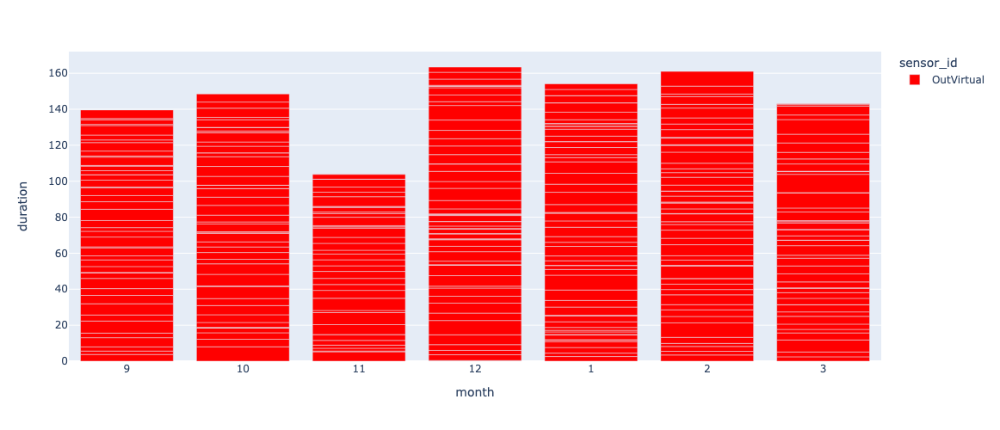

In [84]:
fig = px.bar(out_df, x="month", y="duration", color="sensor_id",
             category_orders={'month':['September', 'October', 'November', 'December', 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', ]},
             color_discrete_map={'OutVirtual': 'red'})
fig.update_layout(
    height=500
)
fig.show()

In [199]:
out_df["ts_mid"] = out_df.ts_on + (out_df.ts_off - out_df.ts_on)/2
out_df["secondsfrommidnight"] = (out_df.ts_on - out_df.ts_on.dt.normalize()).astype(int) // 1000000000
out_df["datetime"] = out_df.ts_mid
out_df = out_df[(out_df.duration>=0.17)]
conc = pd.concat([df,out_df]).sort_values("datetime")
conc = conc[(conc.datetime>="2023-09-01")&(conc.datetime<"2024-04-01")]
conc.month = conc.month.apply(lambda x: str(x))
conc.sensor_id.fillna("temp_peak", inplace=True)
conc = conc[(conc.hour>=11)&(conc.hour<15)]

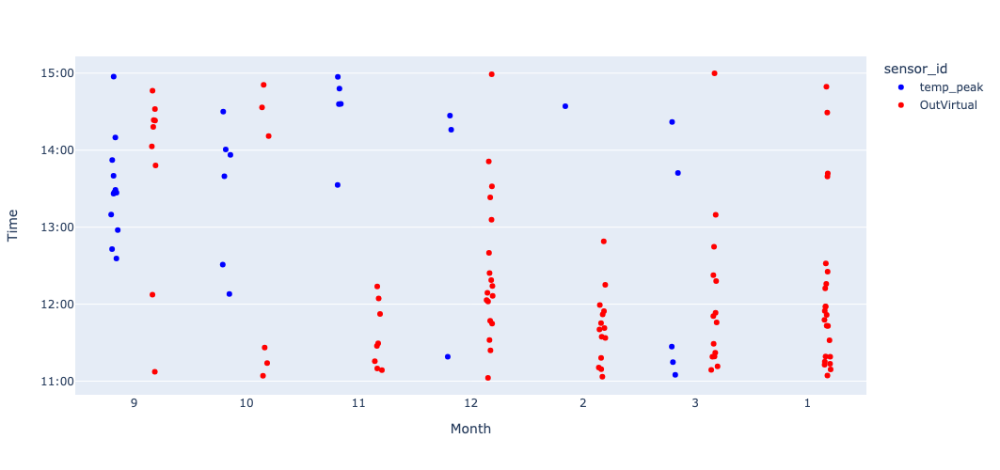

In [200]:
fig = px.strip(conc, x="month", y="secondsfrommidnight", color="sensor_id", color_discrete_map={'OutVirtual': 'red', 'temp_peak': "blue"})
fig.update_yaxes(title_text='Time', tickvals=list(range(0, 86400, 3600)), ticktext=[pd.to_datetime(i, unit='s').strftime('%H:%M') for i in range(0, 86400, 3600)])
fig.update_xaxes(title_text=group_column.capitalize())
fig.update_layout(
    height=500
)
fig.show()

In [201]:
count_df = conc.groupby(["year", "month", "sensor_id"]).size().reset_index(name="count")

In [202]:
count_df.sensor_id = count_df.sensor_id.apply(lambda x: "TempPeak" if x=="temp_peak" else "OutVirtual")

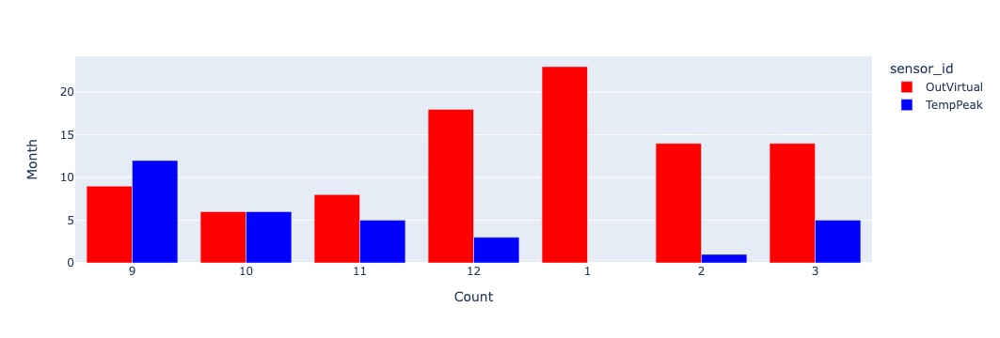

In [203]:
fig = px.bar(count_df, x="month", y="count", color="sensor_id", barmode='group',
             category_orders={'month':['9', '10', '11', '12', '1', '2', '3', '4', '5', '6', '7', '8', ]},
             color_discrete_map={'OutVirtual': 'red', 'TempPeak': "blue"})
fig.update_layout(
    height=300
)
fig.update_layout(
    xaxis_title="Count",
    yaxis_title="Month"
)
fig.show()

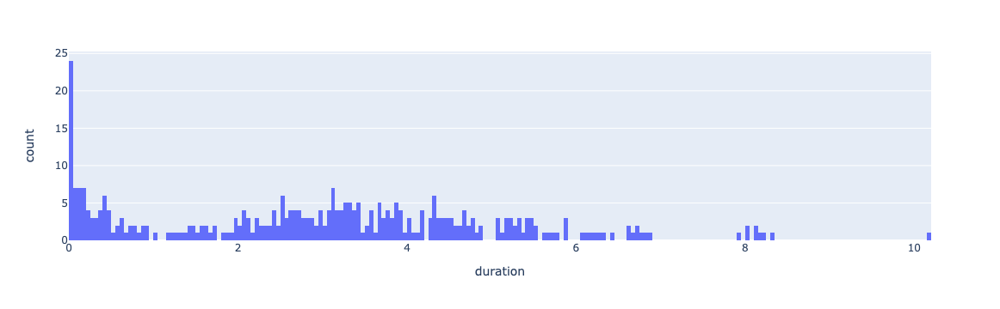

In [90]:
px.histogram(out_df, x="duration", nbins=300)

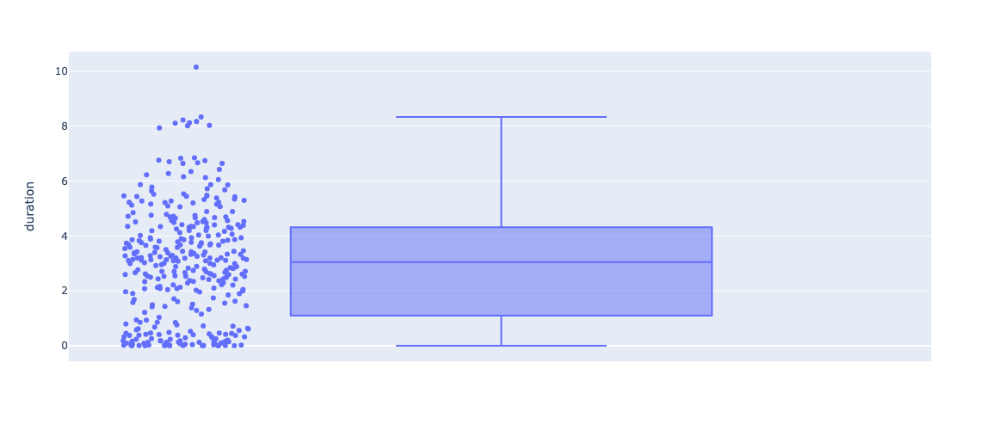

In [91]:
fig = px.box(out_df, y="duration", points="all")
fig.update_layout(
    height=500
)

In [173]:
out_df["type"] = out_df.duration.apply(lambda x: "tiny" if x<0.17 else "short" if x<1 else "medium" if x<4 else "long")

In [174]:
count_df = out_df.groupby(["year", "month", "type"]).size().reset_index(name="count")

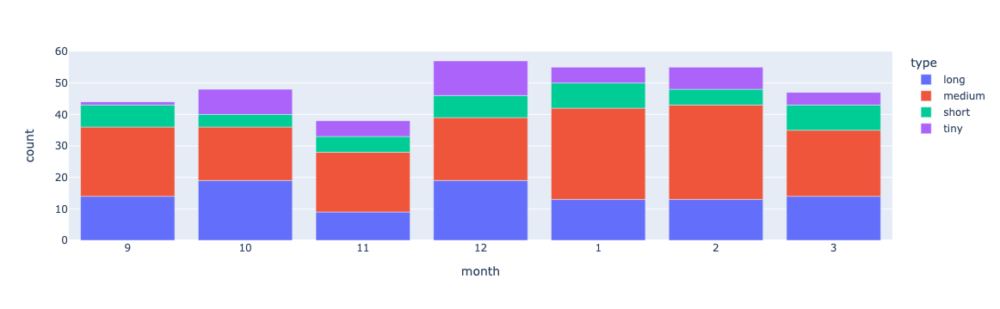

In [175]:
fig = px.bar(count_df, x="month", y="count", color="type",
             category_orders={'month':['9', '10', '11', '12', '1', '2', '3', '4', '5', '6', '7', '8', ]},)
             #color_discrete_map={'OutVirtual': 'red', 'temp_peak': "blue"})
fig.update_layout(
    height=300
)
fig.show()

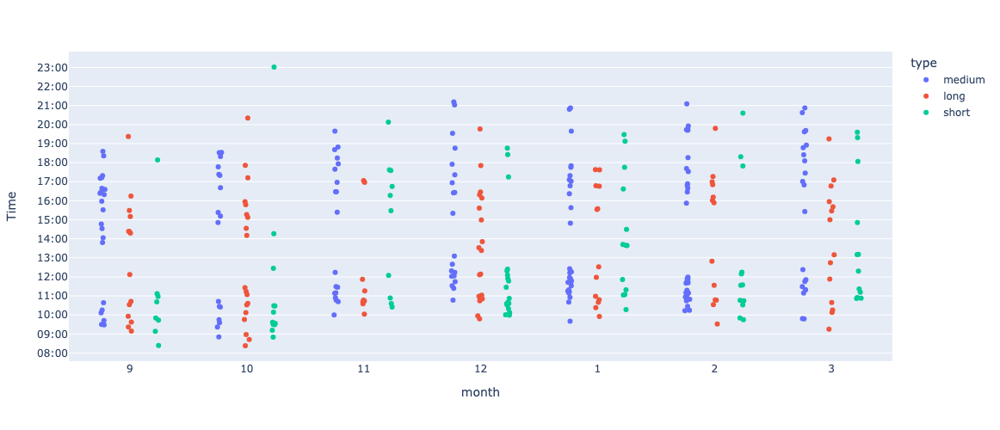

In [95]:
fig = px.strip(out_df, x="month", y="secondsfrommidnight", color="type")
fig.update_yaxes(title_text='Time', tickvals=list(range(0, 86400, 3600)), ticktext=[pd.to_datetime(i, unit='s').strftime('%H:%M') for i in range(0, 86400, 3600)])
fig.update_layout(
    height=500
)
fig.show()

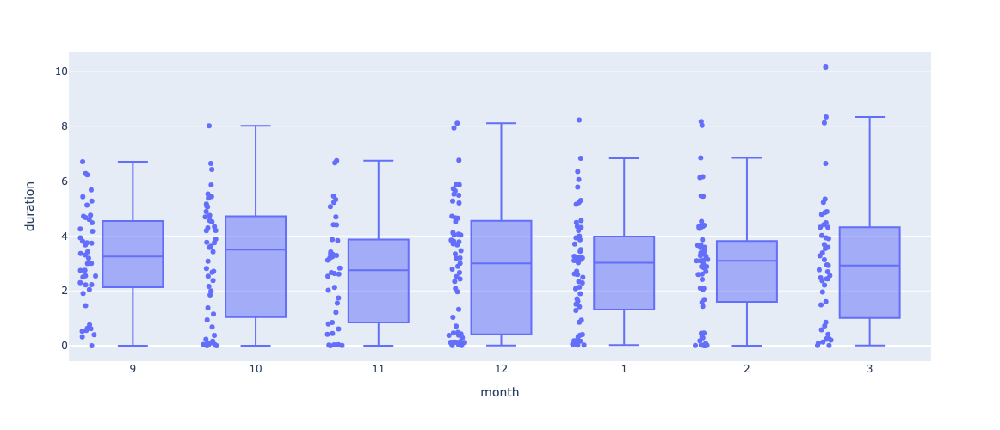

In [96]:
fig = px.box(out_df, x="month", y="duration", points="all")
fig.update_layout(
    height=500
)
fig.show()

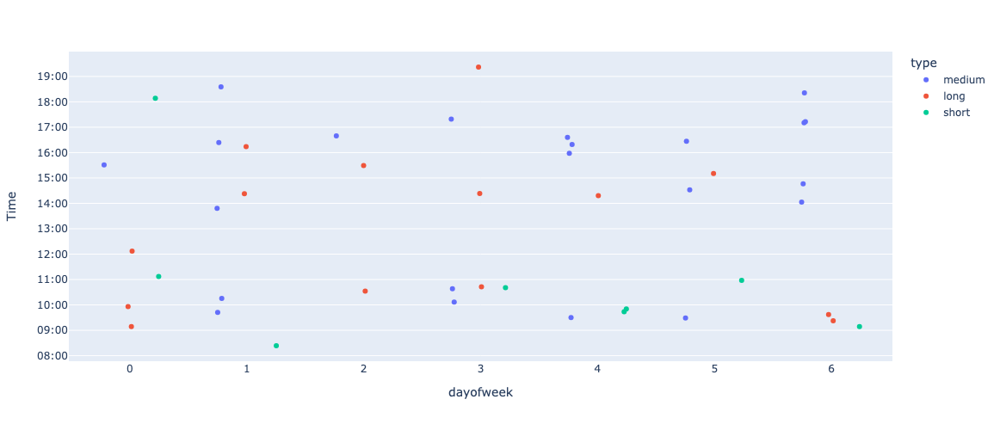

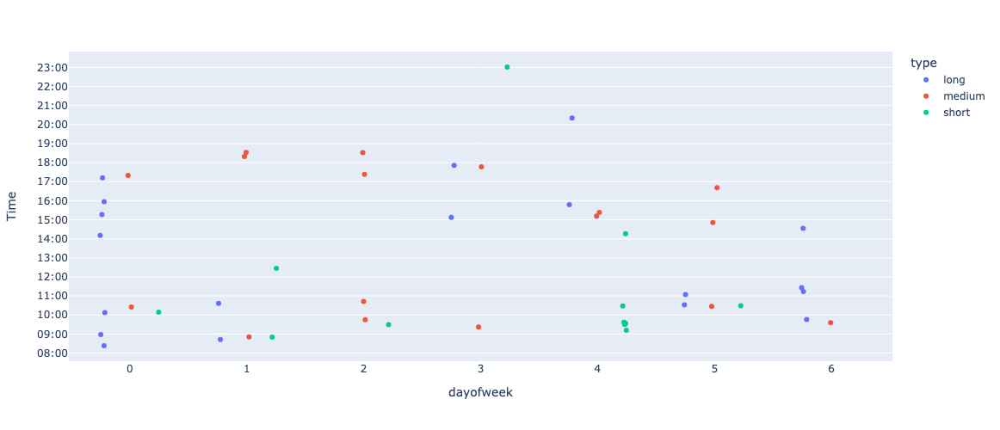

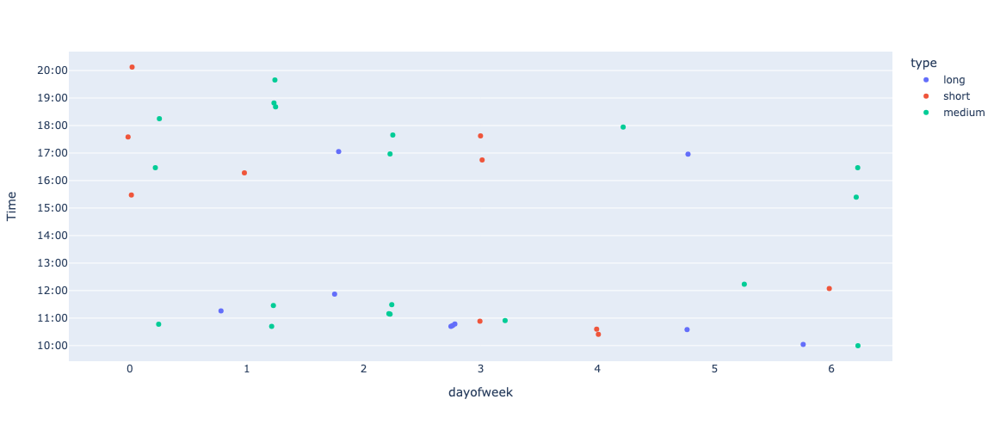

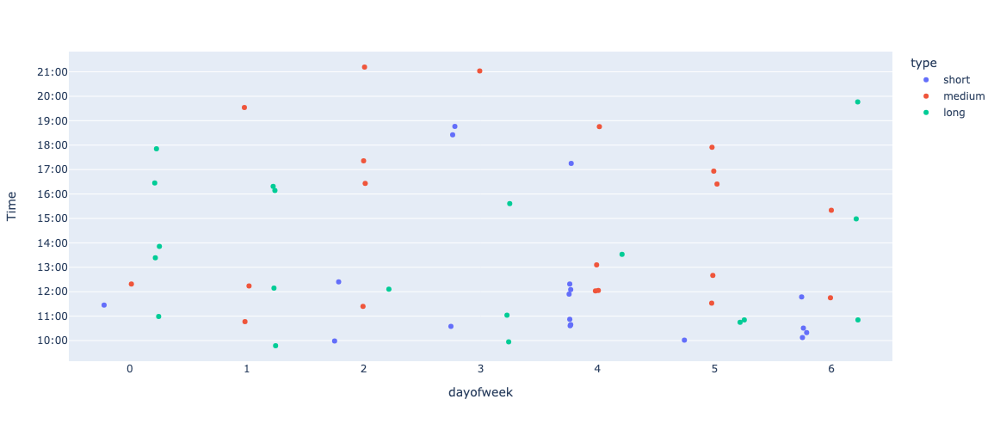

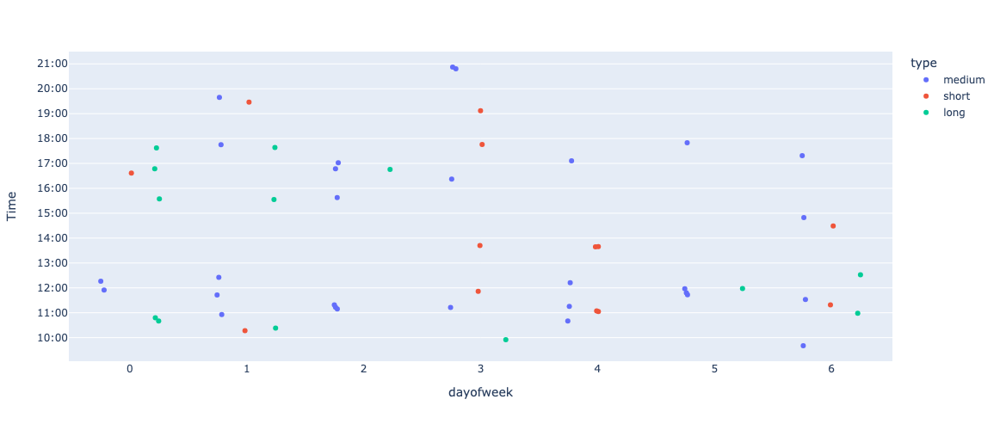

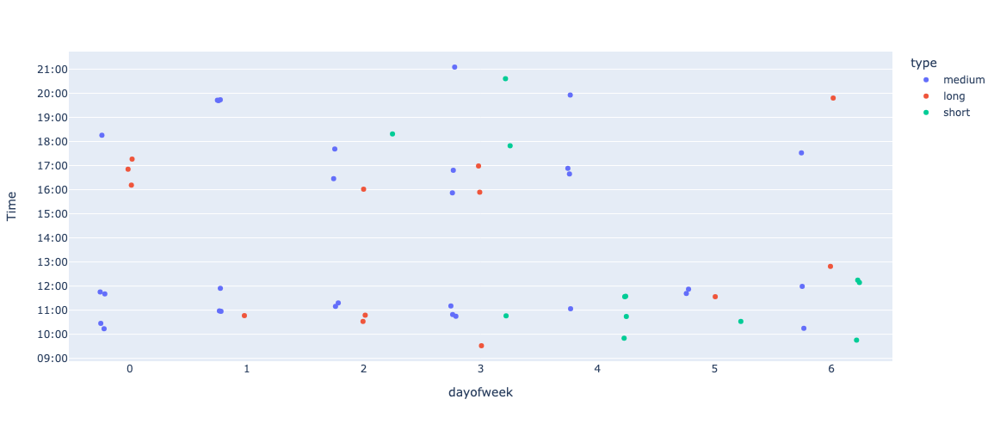

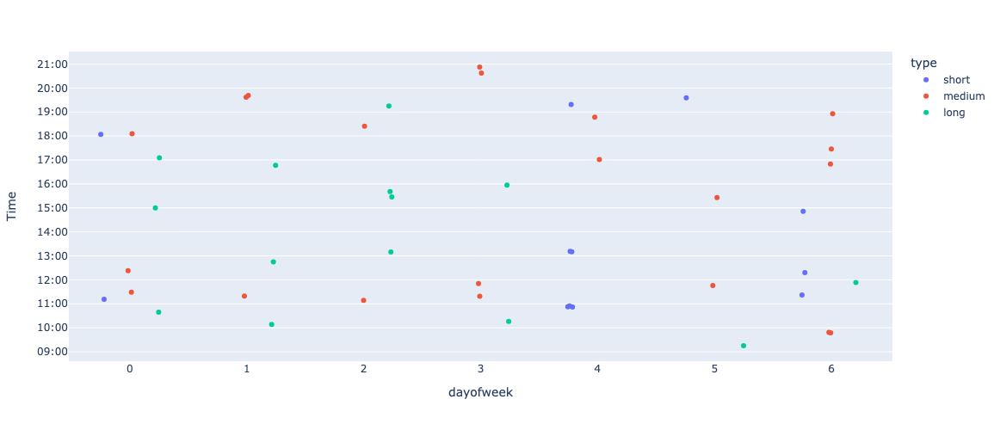

In [97]:
for month in ["9", "10", "11", "12", "1", "2", "3"]:
    fig = px.strip(out_df[out_df.month==month], x="dayofweek", y="secondsfrommidnight", color="type")
    fig.update_yaxes(title_text='Time', tickvals=list(range(0, 86400, 3600)), ticktext=[pd.to_datetime(i, unit='s').strftime('%H:%M') for i in range(0, 86400, 3600)])
    fig.update_layout(
        height=500
    )
    fig.show()

In [98]:
#CAPIRE SE MANCANZA DI PEAK E OUT SONO LO STESSO GIORNO

In [99]:
conc.drop(["year", "dayofmonth", "dayofweek", "week", "hour", "subject_id", "Time", "duration", "ts_mid"], axis=1)


,datetime,month,secondsfrommidnight,group,grouplabel,atHome,sensor_id,ts_on,ts_off,off_hour
12,2023-09-01 08:43:16.314000,9,31396,2.00,9,True,temp_peak,NaT,NaT,NaN
8,2023-09-01 11:22:32.928000,9,34220,NaN,NaN,NaN,OutVirtual,2023-09-01 09:30:20.257,2023-09-01 13:14:45.599,13.00
13,2023-09-01 13:26:02.236000,9,48362,2.00,9,True,temp_peak,NaT,NaT,NaN
9,2023-09-01 17:16:13.941000,9,58746,NaN,NaN,NaN,OutVirtual,2023-09-01 16:19:06.710,2023-09-01 18:13:21.172,18.00
14,2023-09-01 19:31:44.028000,9,70304,2.00,9,True,temp_peak,NaT,NaT,NaN
...,...,...,...,...,...,...,...,...,...,...
270,2024-03-29 09:19:27.950000,3,33567,8.00,3,True,temp_peak,NaT,NaT,NaN
353,2024-03-29 11:17:51.251000,3,39128,NaN,NaN,NaN,OutVirtual,2024-03-29 10:52:08.791,2024-03-29 11:43:33.711,11.00
354,2024-03-29 19:31:09.110500,3,69515,NaN,NaN,NaN,OutVirtual,2024-03-29 19:18:35.473,2024-03-29 19:43:42.748,19.00
271,2024-03-30 06:52:06.240000,3,24726,8.00,3,True,temp_peak,NaT,NaT,NaN


In [100]:
dt = "2024-03-31T11:04:54.689"

In [101]:
out_df

,sensor_id,subject_id,ts_on,ts_off,Time,year,month,dayofmonth,dayofweek,week,hour,off_hour,duration,ts_mid,secondsfrommidnight,datetime,type
8,OutVirtual,2,2023-09-01 09:30:20.257,2023-09-01 13:14:45.599,2023-09-01 09:30:20.257,2023,9,1,4,35,9,13,3.74,2023-09-01 11:22:32.928000,34220,2023-09-01 11:22:32.928000,medium
9,OutVirtual,2,2023-09-01 16:19:06.710,2023-09-01 18:13:21.172,2023-09-01 16:19:06.710,2023,9,1,4,35,16,18,1.90,2023-09-01 17:16:13.941000,58746,2023-09-01 17:16:13.941000,medium
10,OutVirtual,2,2023-09-02 09:29:00.338,2023-09-02 11:46:46.982,2023-09-02 09:29:00.338,2023,9,2,5,35,9,11,2.30,2023-09-02 10:37:53.660000,34140,2023-09-02 10:37:53.660000,medium
11,OutVirtual,2,2023-09-03 09:37:25.754,2023-09-03 14:45:00.291,2023-09-03 09:37:25.754,2023,9,3,6,35,9,14,5.13,2023-09-03 12:11:13.022500,34645,2023-09-03 12:11:13.022500,long
12,OutVirtual,2,2023-09-03 17:13:10.834,2023-09-03 19:45:34.612,2023-09-03 17:13:10.834,2023,9,3,6,35,17,19,2.54,2023-09-03 18:29:22.723000,61990,2023-09-03 18:29:22.723000,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,OutVirtual,2,2024-03-27 15:40:46.797,2024-03-27 23:48:08.234,2024-03-27 15:40:46.797,2024,3,27,2,13,15,23,8.12,2024-03-27 19:44:27.515500,56446,2024-03-27 19:44:27.515500,long
351,OutVirtual,2,2024-03-28 11:50:46.413,2024-03-28 14:24:01.888,2024-03-28 11:50:46.413,2024,3,28,3,13,11,14,2.55,2024-03-28 13:07:24.150500,42646,2024-03-28 13:07:24.150500,medium
352,OutVirtual,2,2024-03-28 15:57:08.917,2024-03-28 20:50:25.418,2024-03-28 15:57:08.917,2024,3,28,3,13,15,20,4.89,2024-03-28 18:23:47.167500,57428,2024-03-28 18:23:47.167500,long
353,OutVirtual,2,2024-03-29 10:52:08.791,2024-03-29 11:43:33.711,2024-03-29 10:52:08.791,2024,3,29,4,13,10,11,0.86,2024-03-29 11:17:51.251000,39128,2024-03-29 11:17:51.251000,short


In [102]:
((out_df.ts_on <= dt) & (dt <= out_df.ts_off)).any()

False

In [103]:
df["atHome"] = df.datetime.apply(lambda x: not((out_df.ts_on <= x) & (x <= out_df.ts_off)).any())

In [104]:
df[df.atHome == False]

,datetime,year,month,dayofmonth,dayofweek,week,hour,secondsfrommidnight,group,grouplabel,atHome
133,2023-12-01 16:13:28.958,2023,12,1,4,48,16,58408,5,12,False


In [115]:
peaks_df = df.sort_values(["datetime"])
peaks_df = peaks_df[(peaks_df.hour>=11)&(peaks_df.hour<15)].sort_values(["datetime"])
peaks_df["date"] = peaks_df.datetime.dt.floor('d')
peaks_df = peaks_df.sort_values(["date"])
peaks_df = peaks_df[peaks_df.date>"2023-09-01"]
peaks_dates = sorted(peaks_df.date.unique())
peaks_dates = [p.astype("datetime64[D]") for p in peaks_dates]
all_dates = np.arange(peaks_dates[0], peaks_dates[-1], dtype='datetime64[D]')
no_peaks_date = set(all_dates) - set(peaks_dates)

In [120]:
out_lunch = out_df[(out_df.hour>=10)&(out_df.hour<15)&(out_df.off_hour>11)].sort_values(["datetime"])
out_lunch["date"] = out_lunch.datetime.dt.floor('d')
out_lunch = out_lunch.sort_values(["date"])
out_lunch = out_lunch[out_lunch.date>"2023-09-01"]
out_lunch_dates = sorted(out_lunch.date.unique())
out_lunch_dates = [o.astype("datetime64[D]") for o in out_lunch_dates]

In [137]:
no_peaks_date_df = pd.DataFrame(list(no_peaks_date), columns=["no_lunch_peaks"])
no_peaks_date_df["month"] = no_peaks_date_df.no_lunch_peaks.dt.month
no_peaks_date_df["dayofweek"] = no_peaks_date_df.no_lunch_peaks.dt.dayofweek
out_lunch_dates_df = pd.DataFrame(list(out_lunch_dates), columns=["out_event_lunch"])
out_lunch_dates_df["month"] = out_lunch_dates_df.out_event_lunch.dt.month
out_lunch_dates_df["dayofweek"] = out_lunch_dates_df.out_event_lunch.dt.dayofweek
no_peak_no_out = no_peaks_date - set(out_lunch_dates)
no_peak_no_out_df = pd.DataFrame(list(no_peak_no_out), columns=["no_peaks_no_out"])
no_peak_no_out_df["month"] = no_peak_no_out_df.no_peaks_no_out.dt.month
no_peak_no_out_df["dayofweek"] = no_peak_no_out_df.no_peaks_no_out.dt.dayofweek

In [154]:
no_peaks_date_count_df = no_peaks_date_df.groupby(["month"]).size().reset_index(name="count")
no_peaks_date_count_df["type"] = "No Peak"
no_peaks_date_count_df.month = no_peaks_date_count_df.month.apply(lambda x: str(x))
out_lunch_dates_count_df = out_lunch_dates_df.groupby(["month"]).size().reset_index(name="count")
out_lunch_dates_count_df["type"] = "Out Lunch"
out_lunch_dates_count_df.month = out_lunch_dates_count_df.month.apply(lambda x: str(x))
no_peak_no_out_count_df = no_peak_no_out_df.groupby(["month"]).size().reset_index(name="count")
no_peak_no_out_count_df["type"] = "No Peak No Out"
no_peak_no_out_count_df.month = no_peak_no_out_count_df.month.apply(lambda x: str(x))

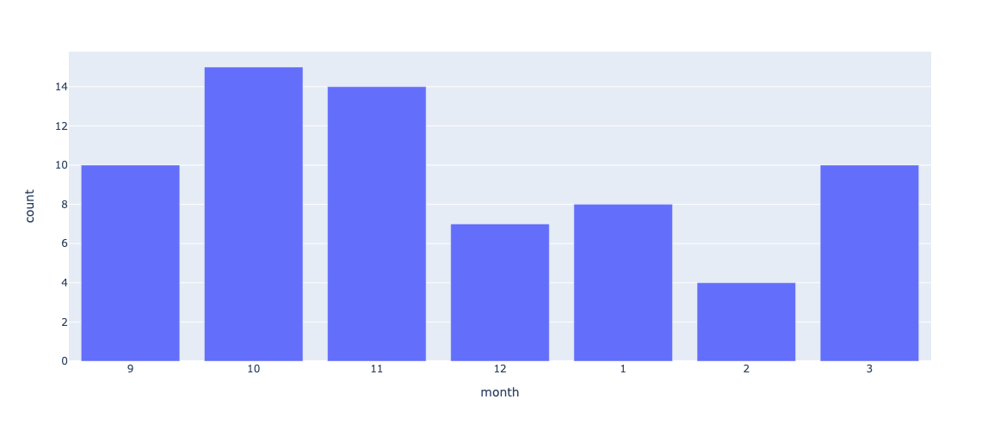

In [161]:
fig = px.bar(no_peak_no_out_count_df, x="month", y="count",
             category_orders={'month':["9","10","11","12","1","2","3","4"]})
fig.update_layout(
    height=500
)
fig.show()

In [209]:
no_peak_no_out_df.sort_values(["no_peaks_no_out"]).iloc[8:58]

,no_peaks_no_out,month,dayofweek
18,2023-09-29,9,4
19,2023-09-30,9,5
20,2023-10-03,10,1
21,2023-10-04,10,2
22,2023-10-05,10,3
23,2023-10-08,10,6
25,2023-10-12,10,3
26,2023-10-13,10,4
27,2023-10-16,10,0
28,2023-10-18,10,2


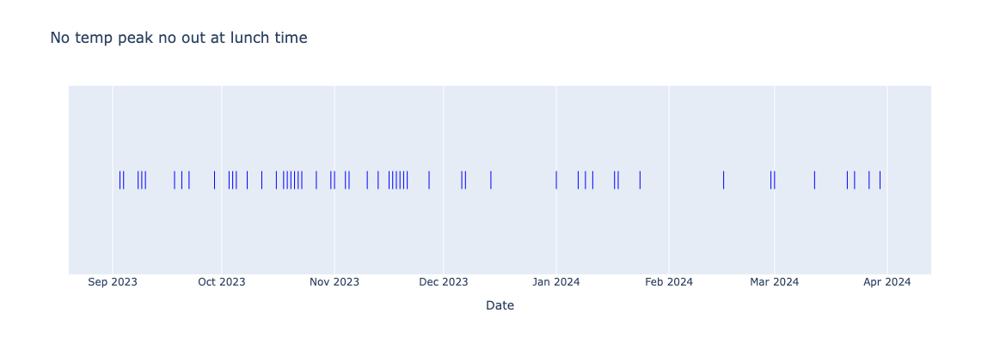

In [70]:
import plotly.graph_objects as go
import datetime

# Assuming you have a list of datetime objects
# Example list of datetime objects
datetime_list = list(no_peak_no_out)
# Create trace for each datetime point
trace = go.Scatter(x=datetime_list, 
                   y=[1]*len(datetime_list),  # y-values are set to 1 to create a line
                   mode='markers',  # markers mode to display points
                   marker=dict(symbol='line-ns-open',  # symbol for each point
                               size=15,  # size of the symbol
                               color='blue'),  # color of the symbol
                   hoverinfo='none')  # disable hover information

# Create layout for the plot
layout = go.Layout(title='No temp peak no out at lunch time',
                   xaxis=dict(title='Date'),
                   yaxis=dict(visible=False),  # hide y-axis
                   showlegend=False,  # hide legend
                   hovermode='closest',  # closest hover mode
                   height=400)  # set height of the plot

# Create figure
fig = go.Figure(data=[trace], layout=layout)

# Show plot
fig.show()


# Drafts

In [63]:
temp_signal

,sensor_id,sensor_status,subject_id
ts,,,
2023-12-17 00:09:02.333,Hum_Temp_Stove,23.21,2
2023-12-17 00:09:02.373,Hum_Temp_Stove,23.21,2
2023-12-17 00:22:05.317,Hum_Temp_Stove,23.17,2
2023-12-17 00:22:05.350,Hum_Temp_Stove,23.17,2
2023-12-17 00:36:08.009,Hum_Temp_Stove,23.03,2
...,...,...,...
2023-12-22 23:38:40.777,Hum_Temp_Stove,23.63,2
2023-12-22 23:38:40.808,Hum_Temp_Stove,23.63,2
2023-12-22 23:45:52.331,Hum_Temp_Stove,23.50,2


In [64]:
max_rows_per_day = temp_signal.resample('D').size().max()

In [66]:
resampled_df.resample('D').size()

ts
2023-12-17    150
2023-12-18    140
2023-12-19    165
2023-12-20    182
2023-12-21    229
2023-12-22    264
Freq: D, dtype: int64

In [67]:
resampled_df

,sensor_id,sensor_status,subject_id
ts,,,
2023-12-17 00:09:02.333,Hum_Temp_Stove,23.21,2
2023-12-17 00:09:02.373,Hum_Temp_Stove,23.21,2
2023-12-17 00:22:05.317,Hum_Temp_Stove,23.17,2
2023-12-17 00:22:05.350,Hum_Temp_Stove,23.17,2
2023-12-17 00:36:08.009,Hum_Temp_Stove,23.03,2
...,...,...,...
2023-12-22 23:38:40.777,Hum_Temp_Stove,23.63,2
2023-12-22 23:38:40.808,Hum_Temp_Stove,23.63,2
2023-12-22 23:45:52.331,Hum_Temp_Stove,23.50,2


In [26]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [33]:
decomp = seasonal_decompose(temp_signal.sensor_status, model='additive', period=24)

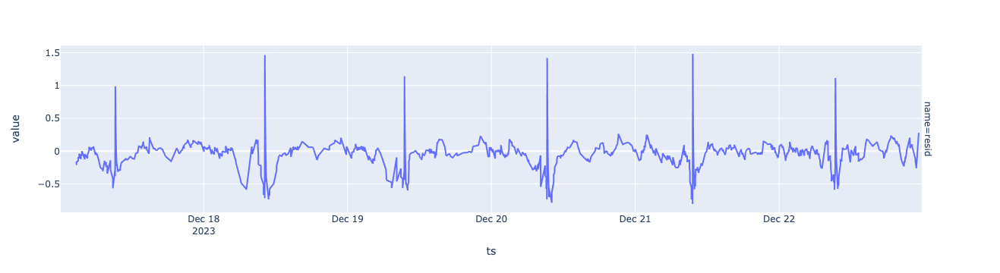

In [40]:
df1 = pd.DataFrame({'value': decomp.trend, 'name': 'trend'}) 
df2 = pd.DataFrame({'value': decomp.seasonal, 'name': 'seasonal'}) 
df3 = pd.DataFrame({'value': decomp.resid, 'name': 'resid'}) 

full_df = pd.concat([df1, df2, df3]) 
fig = px.line(df3, y='value', facet_row='name', title='') 
#fig.update_layout(height=1000) 
fig.show()

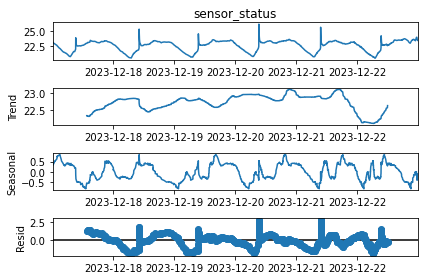

In [32]:
decomp.plot()
plt.show()

In [16]:
import pickle

In [17]:
with open("filename.pkl", "rb") as file:
    df = pickle.load(file)

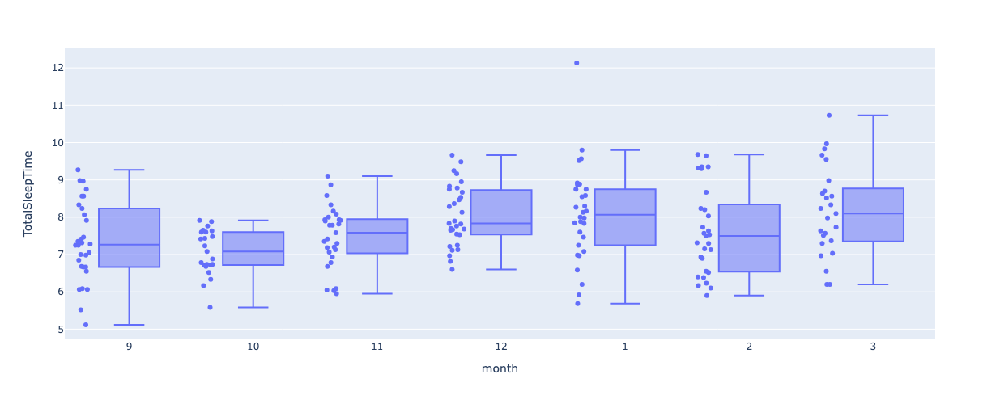

In [18]:
# Distribuzione 

group_column = "month"
df.Time = pd.to_datetime(df.Time)
df["year"] = df.Time.dt.year
df["month"] = df.Time.dt.month
df["dayofmonth"] = df.Time.dt.day
df["dayofweek"] = df.Time.dt.dayofweek
df["week"] = df.Time.dt.isocalendar().week
df["hour"] = df.Time.dt.hour
df.month = df.month.apply(lambda x: str(x))
df.week = df.week.apply(lambda x: str(x))

df.TotalSleepTime = df.TotalSleepTime.apply(lambda x: x/(60*60))
fig = px.box(df, x="month", y="TotalSleepTime", notched=False, points="all")
fig.update_layout(
    height=500
)
fig.show()

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample list of timestamps (replace this with your actual data)
timestamps = [
    pd.Timestamp('2023-09-01 08:43:16.314000'),
    pd.Timestamp('2023-09-01 09:12:35.123000'),
    pd.Timestamp('2023-09-01 10:05:48.987000'),
    pd.Timestamp('2023-09-01 10:25:59.567000'),
    pd.Timestamp('2023-09-01 11:18:20.456000'),
    # Add more timestamps as needed
]

timestamps = temp_peaks


# Convert timestamps to a pandas Series
timestamps_series = pd.Series(timestamps, index=timestamps)

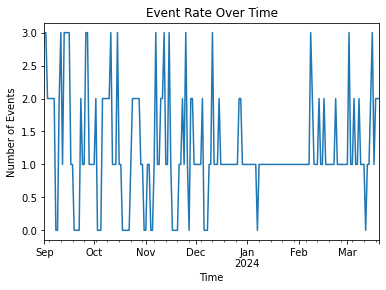

In [70]:
event_rate = timestamps_series.resample('D').count()
event_rate.plot(title='Event Rate Over Time')
plt.xlabel('Time')
plt.ylabel('Number of Events')
plt.show()

Mean Inter-Event Time: 0 days 19:28:27.745306451
Median Inter-Event Time: 0 days 18:17:04.412500


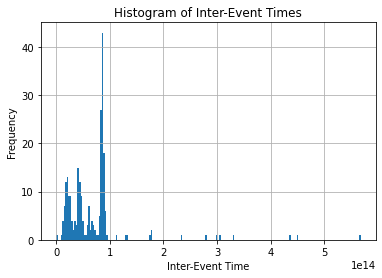

In [79]:
# Inter-Event Time Analysis
inter_event_times = timestamps_series.diff().dropna()  # Calculate time differences between consecutive events
mean_inter_event_time = inter_event_times.mean()
median_inter_event_time = inter_event_times.median()
print("Mean Inter-Event Time:", mean_inter_event_time)
print("Median Inter-Event Time:", median_inter_event_time)
inter_event_times.astype(int).hist(bins=200)
plt.title('Histogram of Inter-Event Times')
plt.xlabel('Inter-Event Time')
plt.ylabel('Frequency')
plt.show()

In [132]:
!pip install lifelines

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.2/349.2 kB 9.2 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.2/94.2 kB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.3/491.3 kB 80.7 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4032 sha256=f647ee6eab7961bf3ab43077c7c7244fd9cc33cecdca6447123cb702967b74b6
  Stored in directory: /home/jovyan/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma

[notice] A new release of pip available: 22.2 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [134]:
import numpy as np
import seaborn as sns
from scipy import fftpack
from scipy.stats import kurtosis
from statsmodels.tsa.seasonal import seasonal_decompose

from lifelines import KaplanMeierFitter

In [135]:
def detect_periodicity(events, freq='M'):
    fft = fftpack.fft(events)
    psd = np.abs(fft) ** 2
    fftfreq = fftpack.fftfreq(len(psd), 1.0 / len(events))
    nonzero_indices = np.where((fftfreq > 0) & (fftfreq < 1 / 2))[0]
    if len(nonzero_indices) == 0:
        return None  # No periodicity detected
    idx = np.argmax(psd[nonzero_indices])
    freq_period = 1 / fftfreq[nonzero_indices[idx]]
    return freq_period

periodicity = detect_periodicity(event_rate)
if periodicity:
    print("Detected Periodicity (hours):", periodicity)
else:
    print("No periodicity detected.")

No periodicity detected.


In [136]:
# Convert inter-event times to seconds for burst detection
inter_event_times_seconds = inter_event_times.dt.total_seconds()

# Event Burst Analysis
burst_threshold = 1 * 3600  # Define threshold for burst detection in seconds (2 hours)
burst_indices = inter_event_times_seconds[inter_event_times_seconds < burst_threshold].index
burst_count = len(burst_indices)
print("Number of Bursts:", burst_count)
print(burst_indices)

Number of Bursts: 1
DatetimeIndex(['2023-09-26 13:27:10.201000'], dtype='datetime64[ns]', freq=None)


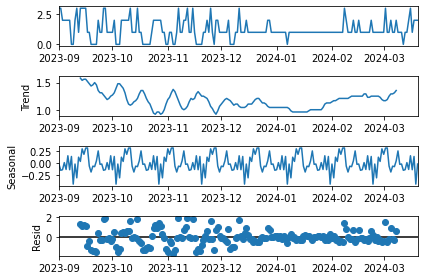

In [137]:
# Time Series Decomposition
decomposition = seasonal_decompose(event_rate, model='additive', period=24)  # Assuming daily seasonality
decomposition.plot()
plt.show()

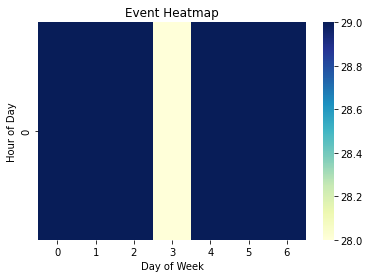

In [138]:
hourly_event_counts = event_rate.reset_index().pivot_table(index=event_rate.index.hour, columns=event_rate.index.dayofweek, values=0, aggfunc='count')
sns.heatmap(hourly_event_counts, cmap="YlGnBu")
plt.title('Event Heatmap')
plt.xlabel('Day of Week')
plt.ylabel('Hour of Day')
plt.show()

In [139]:
temp_peaks

[Timestamp('2023-09-01 08:43:16.314000'),
 Timestamp('2023-09-01 13:26:02.236000'),
 Timestamp('2023-09-01 19:31:44.028000'),
 Timestamp('2023-09-02 08:14:39.833000'),
 Timestamp('2023-09-02 12:42:52.791000'),
 Timestamp('2023-09-02 20:31:23.448000'),
 Timestamp('2023-09-03 08:07:25.761000'),
 Timestamp('2023-09-03 19:59:11.739000'),
 Timestamp('2023-09-04 07:48:24.658000'),
 Timestamp('2023-09-04 16:02:18.533000'),
 Timestamp('2023-09-05 09:42:56.091000'),
 Timestamp('2023-09-05 13:40:02.042000'),
 Timestamp('2023-09-06 08:47:39.323000'),
 Timestamp('2023-09-06 16:57:33.064000'),
 Timestamp('2023-09-07 10:09:45.411000'),
 Timestamp('2023-09-07 15:31:48.040000'),
 Timestamp('2023-09-10 08:31:10.758000'),
 Timestamp('2023-09-10 19:47:37.012000'),
 Timestamp('2023-09-11 08:17:14.992000'),
 Timestamp('2023-09-11 13:09:51.860000'),
 Timestamp('2023-09-11 19:12:11.691000'),
 Timestamp('2023-09-12 08:14:35.252000'),
 Timestamp('2023-09-13 10:01:40.636000'),
 Timestamp('2023-09-13 12:57:45.57

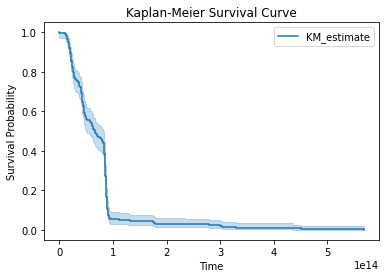

In [140]:
# Survival Analysis (using Kaplan-Meier estimator)
kmf = KaplanMeierFitter()
kmf.fit(inter_event_times, event_observed=np.ones_like(inter_event_times))
kmf.plot()
plt.title('Kaplan-Meier Survival Curve')
plt.xlabel('Time')
plt.ylabel('Survival Probability')
plt.show()


In [141]:

# Event Correlation Analysis (using autocorrelation)
autocorrelation = event_rate.autocorr()
print("Autocorrelation:", autocorrelation)

Autocorrelation: 0.37990853478811887
